In [72]:
function ax(x::Matrix=[0 1])
    # @error "Check Dimensions"
    size(x, 1) == 1 ? 1 : @error throw(DimensionMismatch("$x needs to be a 1 * n matrix"))
    println(x)
end
ax([0 1])

[0 1]


In [1]:
include("./generate_sig.jl")
include("../utils/delay.jl")
include("../utils/preprocess.jl")

In [17]:
include("../sensor.jl")
include("./tone.jl")
using WAV
filename = "./1kHz_tone_sr32kHz.wav";
signal, sample_rate = wavread(filename);
println(size(signal))
freq_interest = 50;
signal, n = tone(10, 1, freq_interest, sample_rate)
println(size(signal))

sensors Loaded: (8,)
sensors1 Loaded: (25,)
sensors2 Loaded: (20,)
sensors_underwater loaded: (40,)
(160000, 1)
(

1, 320000)


In [3]:
using Plots
# plot(signal)

In [4]:
az_gt = 30;
c0 = 1500;
d = generate_time_delay.(sensors_underwater, az_gt, 90, c0)
d .-= minimum(d)

40-element Vector{Float64}:
 0.0011547005383792514
 0.0008660254037844386
 0.0005773502691896256
 0.0002886751345948129
 0.0
 0.0006470276441319003
 0.00032869431079856704
 0.00037059083727151087
 0.001195675056384267
 0.0009479411064611367
 ⋮
 0.002245050807568877
 0.001512675056384267
 0.0015820077731278032
 0.0016514404898713394
 0.0017205732066148756
 0.0017900392566917451
 0.0019826453404252096
 0.0013627653552765265
 0.0010046575039381776

In [44]:
using SignalAnalysis
#=
delay_signal() delays the signal according to time delays in d
thru the frequency domain (might help for non-integerized delays)

Input:
signal      : Signal (num_samples * 1 Matrix)
delays      : Delays for each sensor
fs          : Sampling Frequency of Signal (Hz)
NFFT        : (= Window Size) Number of FFT Points to take
noverlap    : Number of samples overlapping during STFT stride
window      : (A Function) Window function before taking individual FFT

Output:
new_sig     : Delayed Signal at respective channel/sensor
                (Matrix of size num_samples * num_sensors)

For window function, refer to https://docs.juliadsp.org/stable/windows/

Guide to window size & noverlap: 
https://www.dsprelated.com/freebooks/sasp/Choice_Hop_Size.html
=#
function delay_signal(sig, delays::Vector, fs::Int=32000, 
    NFFT::Int=2^11, noverlap::Int=Int(NFFT * (3//4)), window::Function=hanning)
    
    g(y, delay, freq) = y*exp(-1im*2*π*freq*delay);
    new_sig = zeros( size(sig,2), size(delays,1)); # num_samples * num_ch
    S, frequencies, times = generate_STFT(sig[1,:], sample_rate, NFFT, noverlap)

    for (ch, delay) in enumerate(delays)
        new_stft = Matrix{ComplexF64}(undef, size(S,1), size(S,2))
        for (time_idx, ffts) in enumerate(eachcol(S))
            delayed = g.(ffts, delay, frequencies);
            new_stft[:, time_idx] = delayed;
        end
        new_signal = istft(Real, new_stft; nfft=2^11, noverlap=1536, window=window)
        new_sig[1:length(new_signal), ch] = new_signal
        delay_int = Int(ceil(sample_rate*delay))
        new_sig[1:delay_int, ch] .= 0; # Assume no signal for causality reasons
    end

    return new_sig
end

delay_signal (generic function with 6 methods)

In [45]:
using DSP.Util: shiftsignal!
#=
delay_signal() delays the signal according to time delays in d
by simply shifting the signal in the time domain

Input:
signal      : Signal (num_samples * 1 Matrix)
delays      : Delays for each sensor
fs          : Sampling Frequency of Signal (Hz)

Output:
new_sig     : Delayed Signal at respective channel/sensor
                (Matrix of size num_samples * num_sensors)
=#
function delay_signal_shift(signal::Matrix, delays::Vector, sample_rate)
    new_sig = zeros( size(signal,2), size(delays,1));
    for (ch, delay) in enumerate(delays)
        delay_int = Int(ceil(sample_rate * delay))
        new_sig[:, ch] = shiftsignal!(signal[1,:], delay_int);
    end
    return new_sig
end

delay_signal_shift (generic function with 1 method)

In [102]:
2048 * 3 / 4

1536.0

In [46]:
NFFT = 2^11;
noverlap = Int(NFFT * (3 // 4)); # Hamming/Hann Window 
new_sig = delay_signal(signal, d, Int(sample_rate), NFFT, noverlap, hanning)

320000×40 Matrix{Float64}:
  0.0          0.0           0.0          …   0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0          …   0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  ⋮                                       ⋱               
 -2.08278e-7  -1.06413e-7   -4.42088e-8      -3.10823e-7  -1.49861e-7
 -1.49362e-7  -7.49698e-8   -3.0226e-8       -2.24895e-7  -1.06591e-7
 -1.02624e-7  -5.05582e-8   -1.9741e-8       -1.55962e-7  -7.26082e-8
 -6.65385e-8  -3.21431e-8   -1.21269e-8      -1.02105e-7  -4.66539e-8
 -3.

In [9]:
new_sig

320000×40 Matrix{Float64}:
  0.0          0.0           0.0          …   0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0          …   0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  0.0          0.0           0.0              0.0          0.0
  ⋮                                       ⋱               
 -2.08278e-7  -1.06413e-7   -4.42088e-8      -3.10823e-7  -1.49861e-7
 -1.49362e-7  -7.49698e-8   -3.0226e-8       -2.24895e-7  -1.06591e-7
 -1.02624e-7  -5.05582e-8   -1.9741e-8       -1.55962e-7  -7.26082e-8
 -6.65385e-8  -3.21431e-8   -1.21269e-8      -1.02105e-7  -4.66539e-8
 -3.

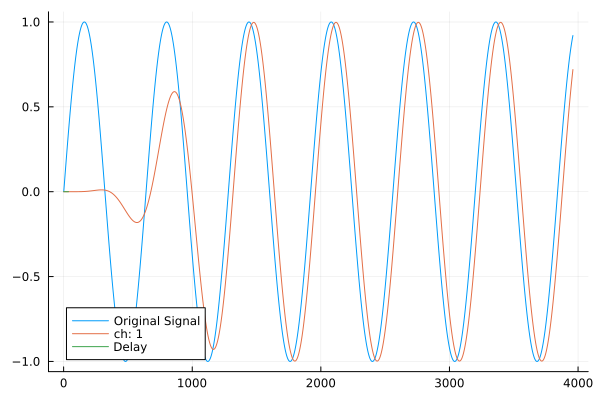

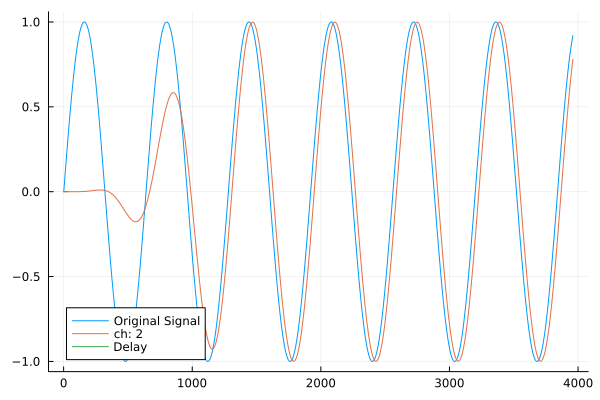

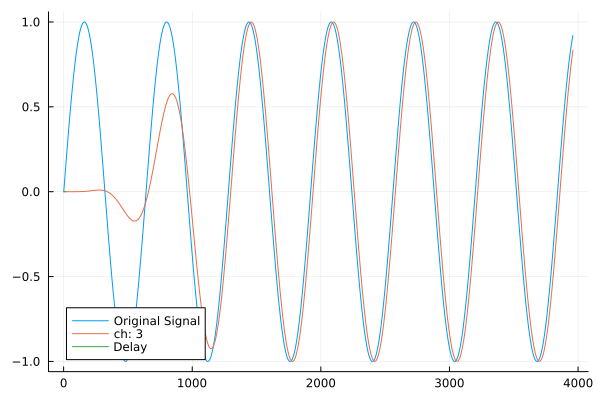

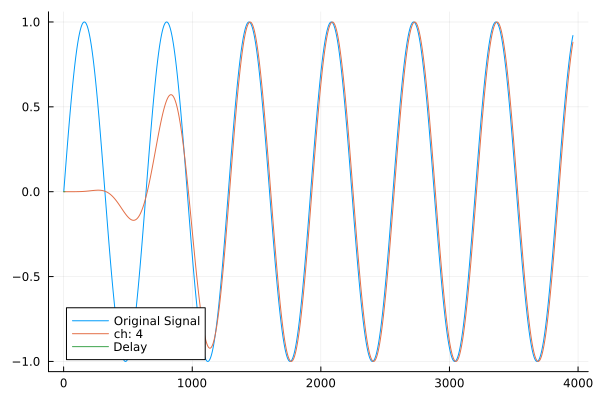

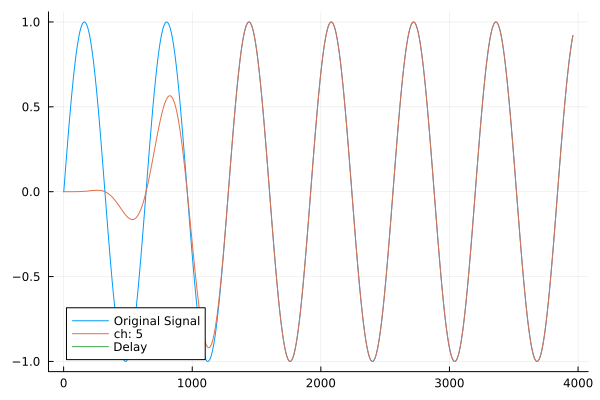

...

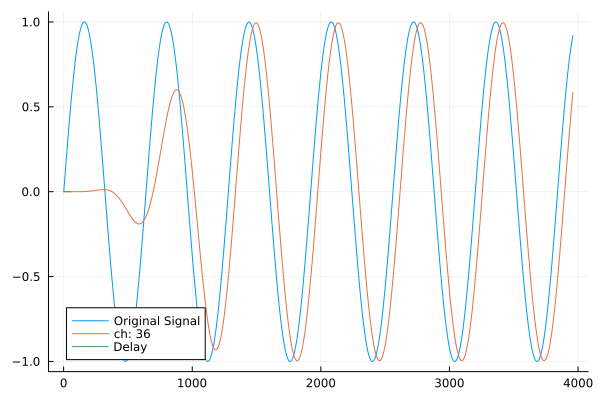

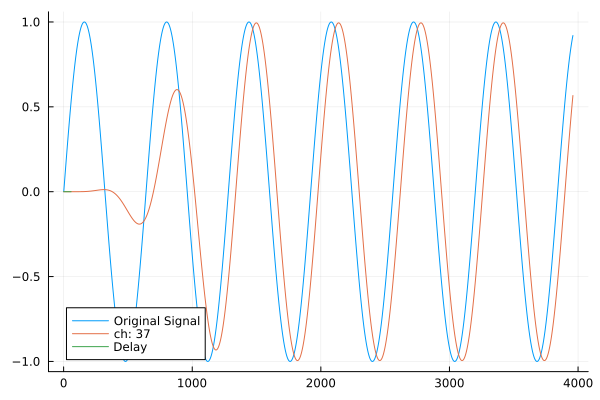

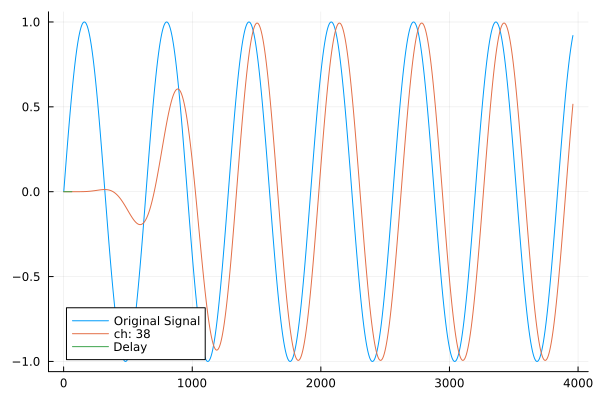

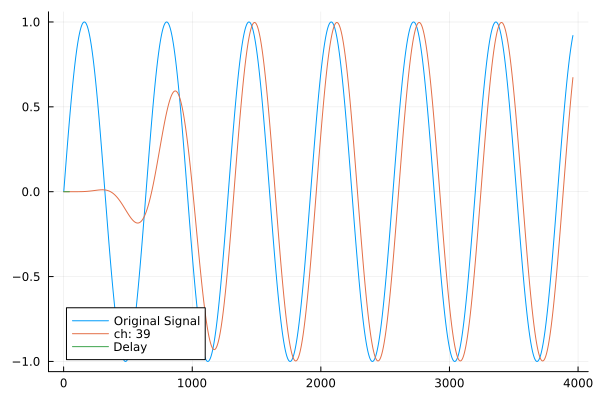

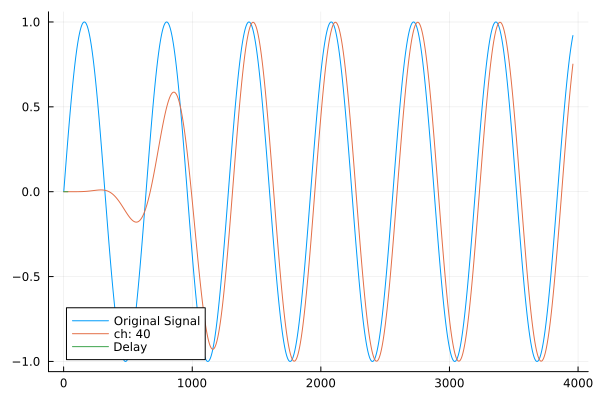

In [47]:
function check_delayed_signal(orig_sig, new_sig, delays)
d_max = 40* Int(round(maximum(delays)*sample_rate));
for (ch, sig) in enumerate(eachcol(new_sig))
    plot(orig_sig[1:d_max], label="Original Signal")
    plot!(sig[1:d_max], label="ch: $ch")
    display(plot!([1; 1+round(delays[ch]*sample_rate)],[0;0], label="Delay"))
end

In [25]:
include("../doa/cbf.jl")
include("../doa/dbf_freeform.jl")

new_S = []
for sig in eachcol(new_sig)
    S_interest = choose_freq(sig, freq_interest, sample_rate);
    push!(new_S, S_interest);
end
# test_sig = Matrix{}(undef, size(new_sig, 2)) 
new_S = mapreduce(permutedims, vcat, new_S);

In [12]:
size(new_S)

(40, 178)

In [41]:
using Statistics
n_snapshots = 2;
Rx = cov(new_S[:,1:n_snapshots], dims=2);
order = 3;
@time P_cbf, az_list = cbf(Rx, sensors_underwater, freq_interest, c0)
@time P_dbf, az_list = dbf_coFree(Rx, sensors_underwater, order, freq_interest, c0)

  0.002349 seconds (15.90 k allocations: 1.631 MiB)
weighting vector: Rational[1//7, 1//7, 1//7, 1//7, 1//7, 1//7, 1//7] has sum 1//1
ψ has rank 7
  0.001304 seconds (13.36 k allocations: 1.106 MiB)


([6231.325711757725, 5959.783894996901, 5666.693733150591, 5355.7223045998235, 5030.610547806762, 4695.122545937113, 4352.996351178626, 4007.8969282750113, 3663.371753514819, 3322.809558656507  …  7202.791586137833, 7252.861911952594, 7260.002571947336, 7225.0012972174845, 7149.13745815113, 7034.1471491411685, 6882.1838659073965, 6695.77539904783, 6477.77760276906, 6231.325711827067], LinRange{Float64}(-180.0, 180.0, 361), ComplexF64[0.0 + 2.3908203039040495e-5im 0.0 + 0.00019087261959543656im … -0.000202821959874734 - 0.000947628789081802im -0.0007655650718008316 - 0.00024881805381223124im; -0.0013695261293235575 + 0.0im -0.005463097987779859 + 0.0im … 0.006009700956152899 - 0.014914890292374024im -0.004392940862485556 - 0.01352265060754891im; … ; -0.0013695261293235575 + 0.0im -0.005463097987779859 + 0.0im … 0.006009700956152899 + 0.014914890292374024im -0.004392940862485556 + 0.01352265060754891im; 0.0 + 2.3908203039040495e-5im 0.0 + 0.00019087261959543656im … 0.000202821959874734 -

In [42]:
function normalize_P(P, az_list) 
    (P_max, max_idx) = findmax(P);
    return (P ./ P_max), az_list[max_idx]
end

P_cbf_norm, az_cbf_max = normalize_P(P_cbf, az_list)
P_dbf_norm, az_dbf_max = normalize_P(P_dbf, az_list)

([0.013628302717496847, 0.01303442362170622, 0.012393416934858686, 0.011713302788877568, 0.01100226285234643, 0.01026852941277663, 0.009520277826287386, 0.008765523602143761, 0.008012025294942295, 0.007267194274970621  …  0.015752959913763888, 0.015862466877278842, 0.015878083951479834, 0.015801533954002307, 0.015635614948652145, 0.015384123883466883, 0.015051770589536695, 0.01464408350447979, 0.014167308561737106, 0.013628302717648502], 34.0)

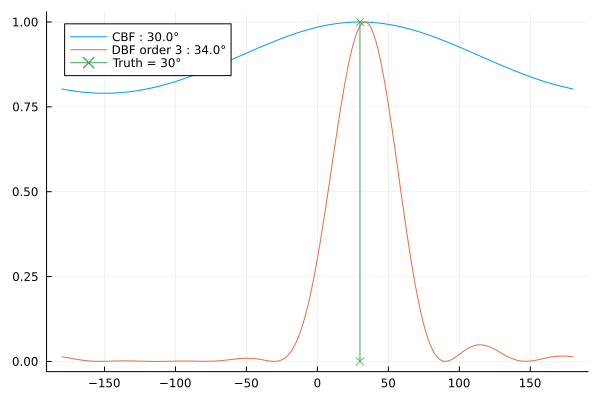

In [43]:
plot(az_list, P_cbf ./ maximum(P_cbf), label="CBF : $(az_cbf_max)°")
plot!(az_list, P_dbf ./ maximum(P_dbf), label="DBF order $order : $(az_dbf_max)°")
plot!([az_gt; az_gt], [0; 1], marker=:x, label="Truth = $(az_gt)°")

In [91]:
3:5 |> sum |> sqrt

3.4641016151377544